In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
import pathlib
import shutil
import tempfile
from PIL import Image
from itertools import cycle
import os
from  IPython import display
from scipy.interpolate import interp1d
from scipy.ndimage.interpolation import rotate, shift
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Lambda, Input
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras import regularizers, optimizers
import warnings
np.random.seed(123)
tf.random.set_seed(123)
warnings.filterwarnings('ignore')

In [ ]:
#Static Configurations
IMAGE_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/Images/'
DATA_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/'

In [ ]:
# Load Data
train_data = pd.read_csv(DATA_DIR + 'S40AR_train_data.csv')
test_data = pd.read_csv(DATA_DIR + 'S40AR_test_data.csv')

## Encoding Targets

In [ ]:
#Encode labels

action_encoder = LabelEncoder()
action_cls_encoder = LabelEncoder()
train_data['action_label'] = action_encoder.fit_transform(train_data['action'])
train_data['action_class_label'] = action_cls_encoder.fit_transform(train_data['action_class'])

## Data Loader

In [ ]:
# Data Generator
class ImageDataLoader(tf.keras.utils.Sequence):
    def __init__(self,
                 df,
                 batch_size=32,
                 dim=(224,224, 3),
                 img_size = (224,224),
                 n_actions =21,
                 n_action_cls = 5,
                 data_mean=0,
                 data_std=1,
                 data_prefix='',
                 shuffle=True,
                 Augment=True):
        
        'Initialization'
        self.dim = dim  # Dimensions of the input
        self.batch_size = batch_size # Batch size
        self.img_size = img_size # Image size
        self.n_actions = n_actions  # Number of actions
        self.n_action_cls = n_action_cls  # Number of action class   
        self.shuffle = shuffle  # Flag to shuffle data at the end of epoch
        self.Augment = Augment  # Flag to augment the data

        # The data is input as a pandas dataframe, we need to read the relevent fields
        self.df = df
        self.action = df['action_label'].values.tolist()
        self.action_class = df['action_class_label'].values.tolist()
        self.image_ids = np.arange(len(self.df.index)).tolist()
        self.data_prefix = data_prefix
        
        # Data normalization parameters
        self.data_mean = data_mean
        self.data_std = data_std
        
        self.on_epoch_end()
        
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data for the given index'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        # Find list of IDs
        data_ids_temp = [self.image_ids[k] for k in indexes]
        action_temp = [self.action[k] for k in indexes]
        action_class_temp = [self.action_class[k] for k in indexes]
        
        # Generate data
        X, first_target, second_target = self.__data_generation(data_ids_temp, action_temp, action_class_temp)
        
        return X,[first_target, second_target]

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.image_ids))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
            
    def __data_generation(self, data_ids_temp, action_temp, action_class_temp):
        'Generates data containing batch_size samples' 

        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        first_target = np.empty((self.batch_size), dtype=int)
        second_target = np.empty((self.batch_size), dtype = int)
        
        # Generate data
        for i, ids in enumerate(data_ids_temp):
            
            X[i,] = self.__read_data_instance(data_ids_temp[i])
            first_target[i] = action_temp[i]
            second_target[i] = action_class_temp[i]
            
        return X, first_target, second_target


    def __read_data_instance(self, pid):
      # Read an image
      filepath = self.data_prefix + self.df.iloc[pid]['FileName']
      
      data = Image.open(filepath)
      data = data.resize(self.img_size) # Resize image
      data = np.asarray(data) # Convert into numpy array
      
      #Augmentation techniques
      if self.Augment:
        data = tf.image.resize_with_crop_or_pad(data, 240, 240)
        data = tf.image.random_crop(data, size = [224,224,3])
        data = tf.image.random_flip_left_right(data)
        data = tf.image.random_brightness(data, max_delta = 0.5)
        rot = np.random.rand(1) < 0.5
        if rot:
            rot = np.random.randint(-15,15, size=1)
            data = rotate(data, angle=rot[0], reshape=False)
          
        shift_val = np.random.randint(-5, high=5, size=2, dtype=int).tolist() + [0,]
        data = shift(data, shift_val, order=0, mode='constant', cval=0.0, prefilter=False)

      X = data
      # Input normalization
      X = (X - self.data_mean)/self.data_std
      return X

# Data Preparation

In [ ]:
train_val, test = train_test_split(train_data,test_size = 0.15, random_state = 42, stratify = train_data[['action_label','action_class_label']])
train, valid = train_test_split(train_val, test_size = 0.15, random_state = 42, stratify = train_val[['action_label','action_class_label']])

# Modeling Configurations

In [ ]:
# Model Buidling Static Configurations
BATCH_SIZE = 64
IMG_DIM = (224, 224, 3)
IMG_SIZE = (224, 224)
NUM_EPOCHS = 100 #Num Epochs
CHECKPOINT_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/checkpoint/' # Checkpoint
N_TRAIN = train.shape[0] # Num of training examples
STEPS_PER_EPOCH = N_TRAIN//BATCH_SIZE # Steps for scheduler
LR = 0.01 # Learning rate
model_histories = {}

In [ ]:
# No shuffle because we don't compute GD here!
val_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':False,
    'data_prefix': IMAGE_DIR}

validation_generator = ImageDataLoader(valid,**val_params) # Validation generator

In [ ]:
# Inverse transformation to actual labels
target_action = action_encoder.inverse_transform(np.arange(21))
target_action_class = action_cls_encoder.inverse_transform(np.arange(5))


def plot_confusion_matrix(y_test,y_pred, x_range = 21, target_label = None, title = 'Action'):

    conf_data = metrics.confusion_matrix(y_test,y_pred)
    df_cm = pd.DataFrame(conf_data, columns=np.unique(y_test), index = np.unique(y_test))
    df_cm.index.name = 'Actual'
    df_cm.columns.name = 'Predicted'
    plt.figure(figsize = (20,12))
    plt.title(title)
    sns.set(font_scale=1.4)#for label size
    sns.heatmap(df_cm, cmap="Blues",annot=True,square=True,annot_kws={"size": 16},fmt="g")
    plt.xticks(np.arange(x_range), target_label, rotation = 90)
    plt.yticks(np.arange(x_range), target_label, rotation = 0)
    plt.tight_layout()
    return plt.show()

def model_result(model, generator):
  
  action_preds = []
  action_trues = []
  action_cls_preds = []
  action_cls_trues = []
  N_images = len(generator.image_ids)
  
  batches = 0

  # iterate through the data generator and predict for each batch
  # hold the predictions and labels
  
  for x,[y,z] in generator.__iter__():
    action_pred, action_cls_pred = model.predict(x, verbose=0)
    
    action_pred = np.argmax(action_pred, axis = 1)
    action_cls_pred = np.argmax(action_cls_pred, axis = 1)
    # actions
    action_preds = action_preds + action_pred.tolist()
    action_trues = action_trues + y.tolist()
    
    # action class
    action_cls_preds = action_cls_preds + action_cls_pred.tolist()
    action_cls_trues = action_cls_trues + z.tolist()

    batches += 1
    if batches >= N_images / BATCH_SIZE:
        #break the loop
        break
  print("Action Macro F1-score: ", metrics.f1_score(action_trues, action_preds,average = "macro"))
  print("Action Class Macro F1-Score : ", metrics.f1_score(action_cls_trues,action_cls_preds,average= "macro"))
  print('------------------------------------------------------------------------------------------------------------')
  print("Action Classification Report \n", metrics.classification_report(action_trues, action_preds, target_names = target_action))
  print('---------------------------------------------------------------------------------------------------------------')
  print("Action Class Classification Report \n", metrics.classification_report(action_cls_trues, action_cls_preds, target_names = target_action_class))
  print('---------------------------------------------------------------------------------------------------------------')
  plot_confusion_matrix(action_trues, action_preds, x_range = 21, target_label = target_action, title = "Action Confusion Matrix")
  print('---------------------------------------------------------------------------------------------------------------')
  plot_confusion_matrix(action_cls_trues, action_cls_preds, x_range = 5, target_label = target_action_class, title = "Action Class Confusion Matrix")

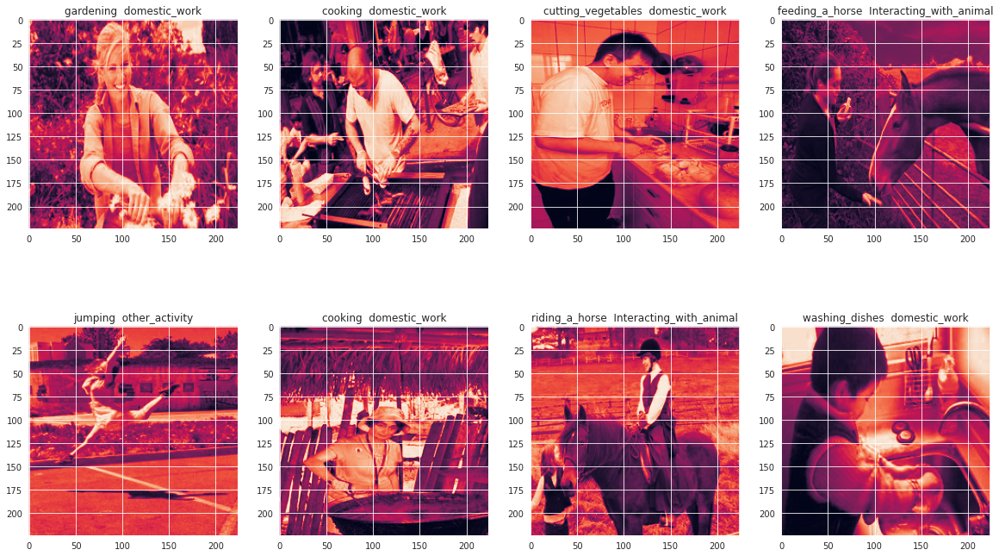

In [ ]:
# plt.figure(figsize = (20,12))
# i = 0
# for x,y in no_aug_training_generator.__iter__():
#   plt.subplot(2,4,i+1)
#   plt.imshow(x[i,:,:,0])
#   plt.title(str(clabels[y[0][i]]) +'  ' + str(actions[y[1][i]]))
#   i = i + 1
#   if i == 8:
#     break

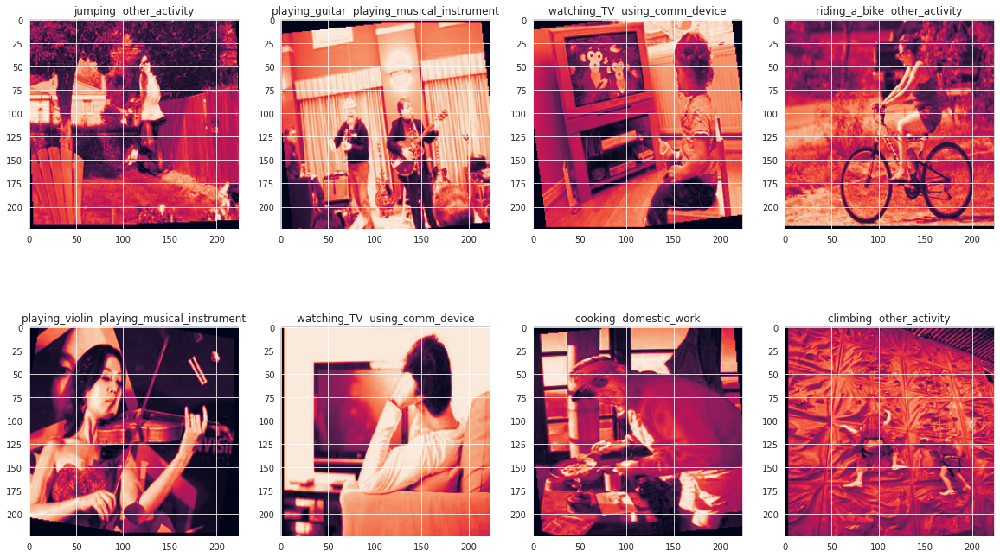

In [ ]:
# plt.figure(figsize = (20,12))
# i = 0
# for x,y in aug_training_generator.__iter__():
#   plt.subplot(2,4,i+1)
#   plt.imshow(x[i,:,:,0])
#   plt.title(str(clabels[y[0][i]]) +'  ' + str(actions[y[1][i]]))
#   i = i + 1
#   if i == 8:
#     break

## Error Analysis

### Performance on Validation Set

#### VGG_16

In [ ]:
vgg_16 = tf.keras.models.load_model(DATA_DIR + 'vgg_16_finetuned_model')

Action Macro F1-score:  0.5912907077406316
Action Class Macro F1-Score :  0.7804625813925166
------------------------------------------------------------------------------------------------------------
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.71      0.71      0.71        14
          climbing       0.91      0.80      0.85        25
           cooking       0.43      0.38      0.40        24
cutting_vegetables       0.18      0.18      0.18        11
   feeding_a_horse       0.71      0.74      0.72        23
         gardening       0.50      0.46      0.48        13
           jumping       0.89      0.64      0.74        25
           phoning       0.44      0.37      0.40        19
    playing_guitar       0.94      0.62      0.75        24
    playing_violin       0.57      0.65      0.60        20
     riding_a_bike       1.00      0.96      0.98        25
    riding_a_horse       0.66      0.84      0

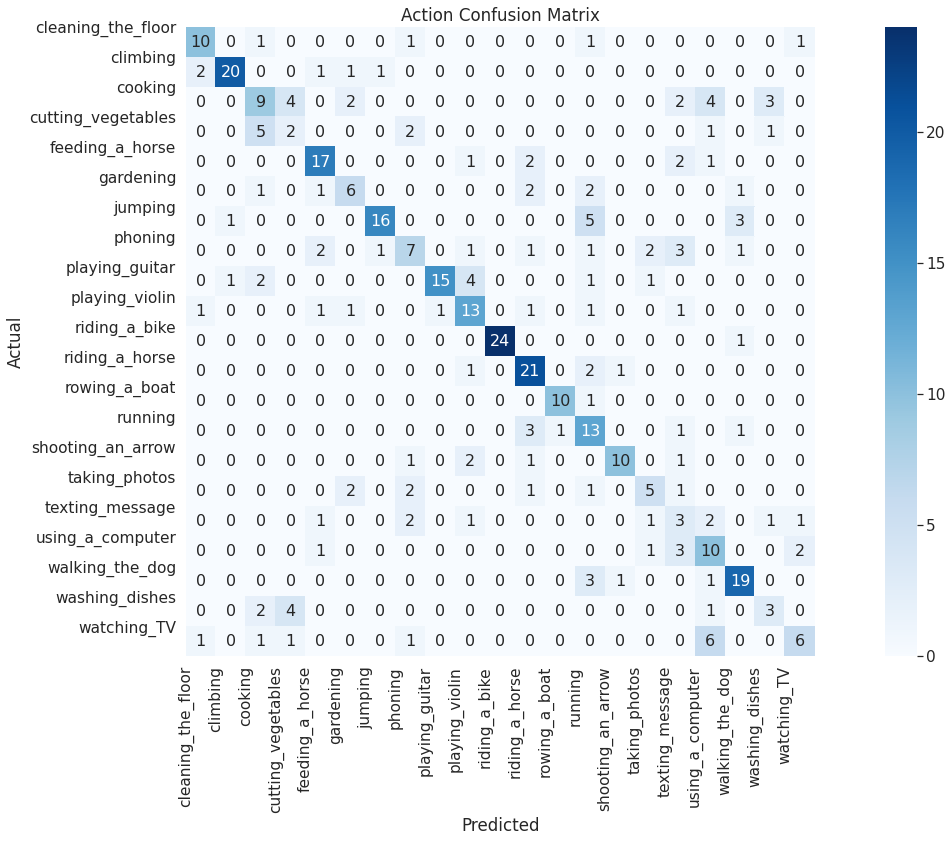

---------------------------------------------------------------------------------------------------------------


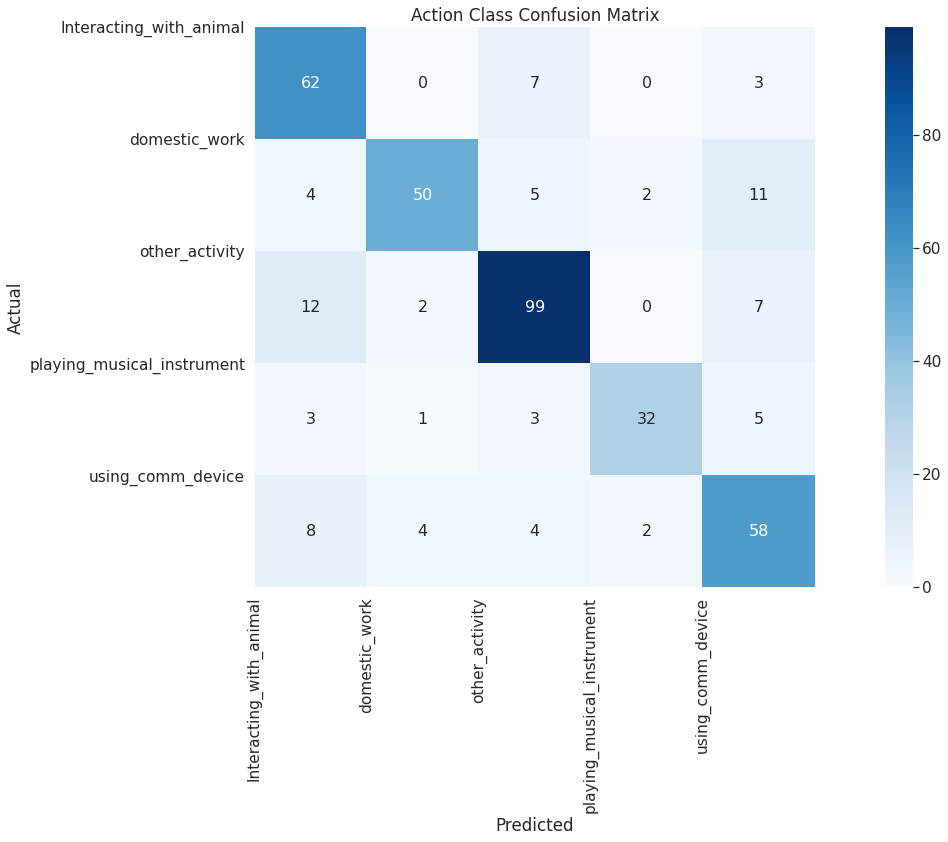

In [ ]:
# Validation Performance

model_result(vgg_16, validation_generator)

#### InceptionV3

Action Macro F1-score:  0.8031478030454635
Action Class Macro F1-Score :  0.9157273726187389
------------------------------------------------------------------------------------------------------------
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.85      0.79      0.81        14
          climbing       0.83      0.96      0.89        25
           cooking       0.69      0.83      0.75        24
cutting_vegetables       0.67      0.55      0.60        11
   feeding_a_horse       0.81      0.96      0.88        23
         gardening       0.91      0.77      0.83        13
           jumping       0.78      0.84      0.81        25
           phoning       0.87      0.68      0.76        19
    playing_guitar       0.96      0.96      0.96        24
    playing_violin       1.00      0.90      0.95        20
     riding_a_bike       0.89      1.00      0.94        25
    riding_a_horse       0.92      0.92      0

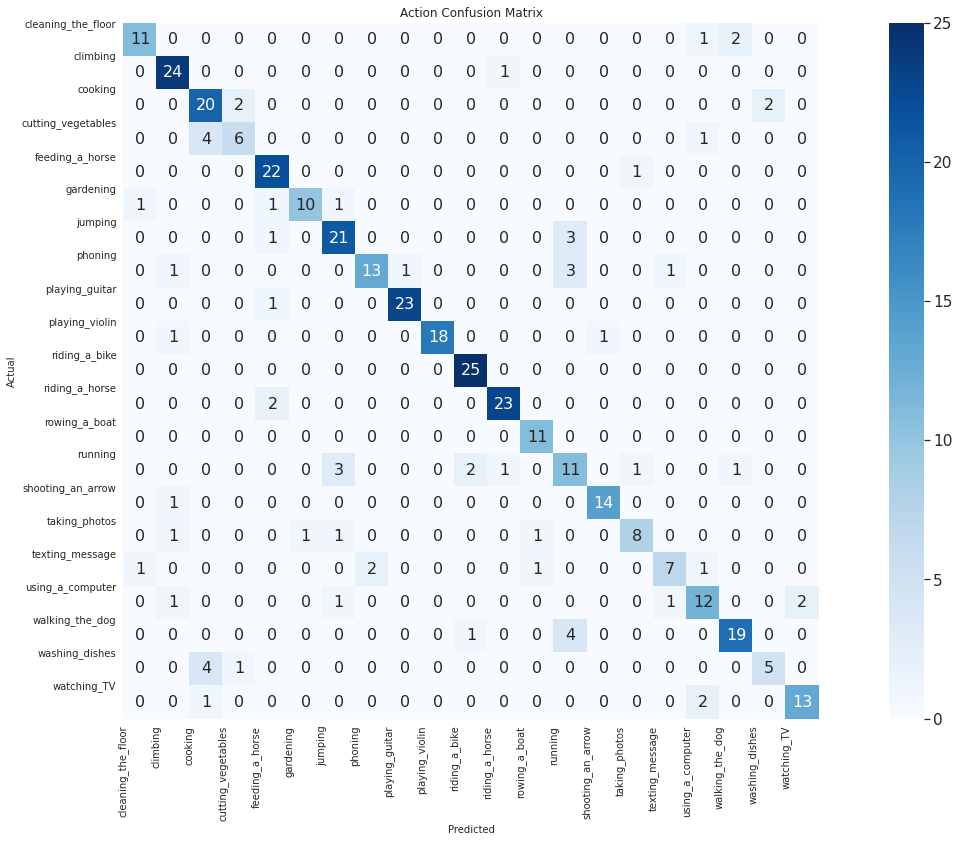

---------------------------------------------------------------------------------------------------------------


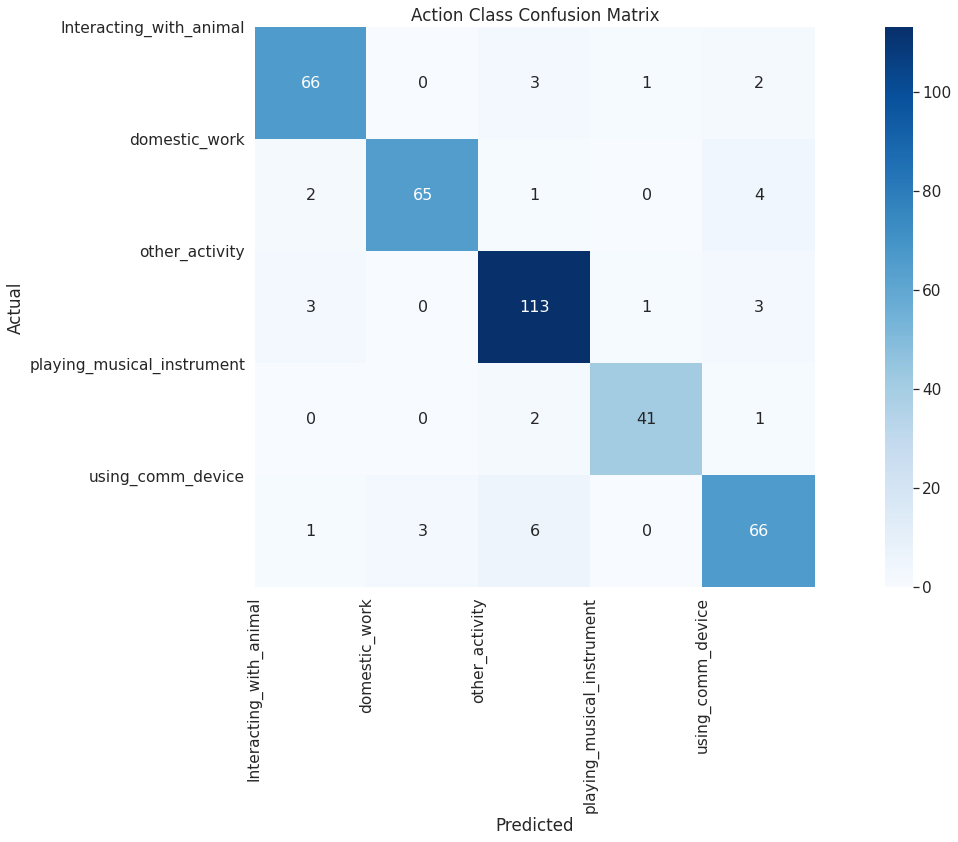

In [ ]:
#Inception final model
inceptionv3 = tf.keras.models.load_model('/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_fine_tuned')
model_result(inceptionv3, validation_generator)

#### Nasnet Mobile

Action Macro F1-score:  0.7653901456049274
Action Class Macro F1-Score :  0.9274637666730291
------------------------------------------------------------------------------------------------------------
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       1.00      0.79      0.88        14
          climbing       0.80      0.96      0.87        25
           cooking       0.82      0.75      0.78        24
cutting_vegetables       0.50      0.64      0.56        11
   feeding_a_horse       0.95      0.91      0.93        23
         gardening       0.92      0.92      0.92        13
           jumping       0.83      0.76      0.79        25
           phoning       0.57      0.68      0.62        19
    playing_guitar       0.89      1.00      0.94        24
    playing_violin       0.73      0.80      0.76        20
     riding_a_bike       1.00      1.00      1.00        25
    riding_a_horse       0.96      0.92      0

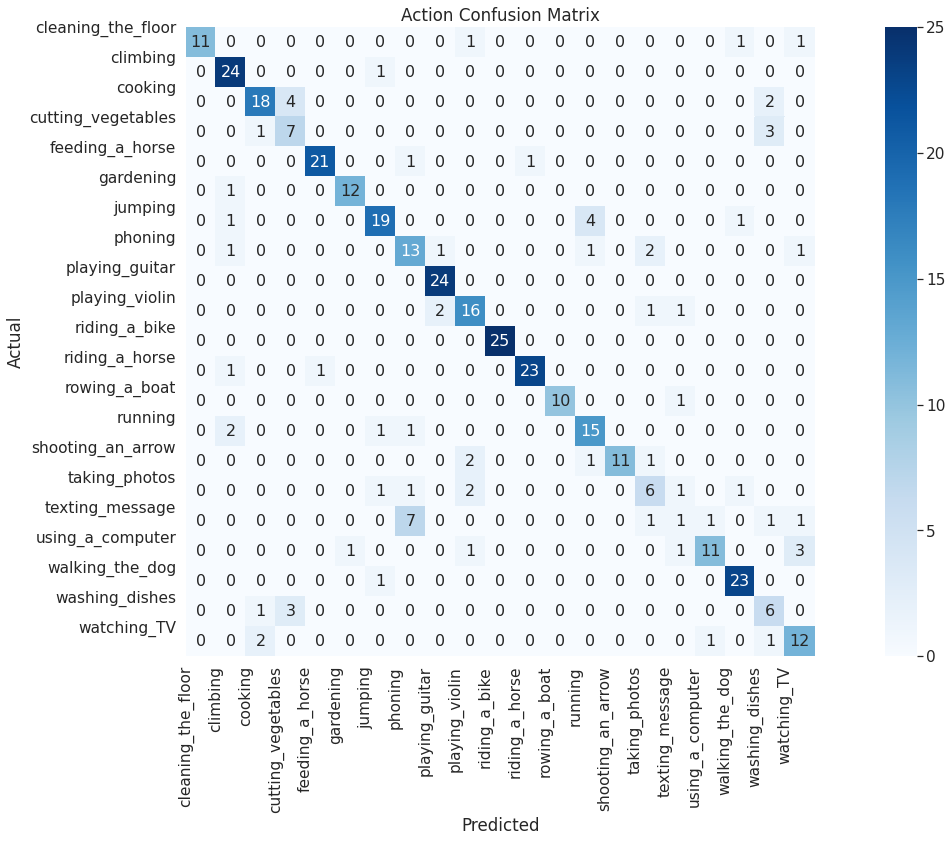

---------------------------------------------------------------------------------------------------------------


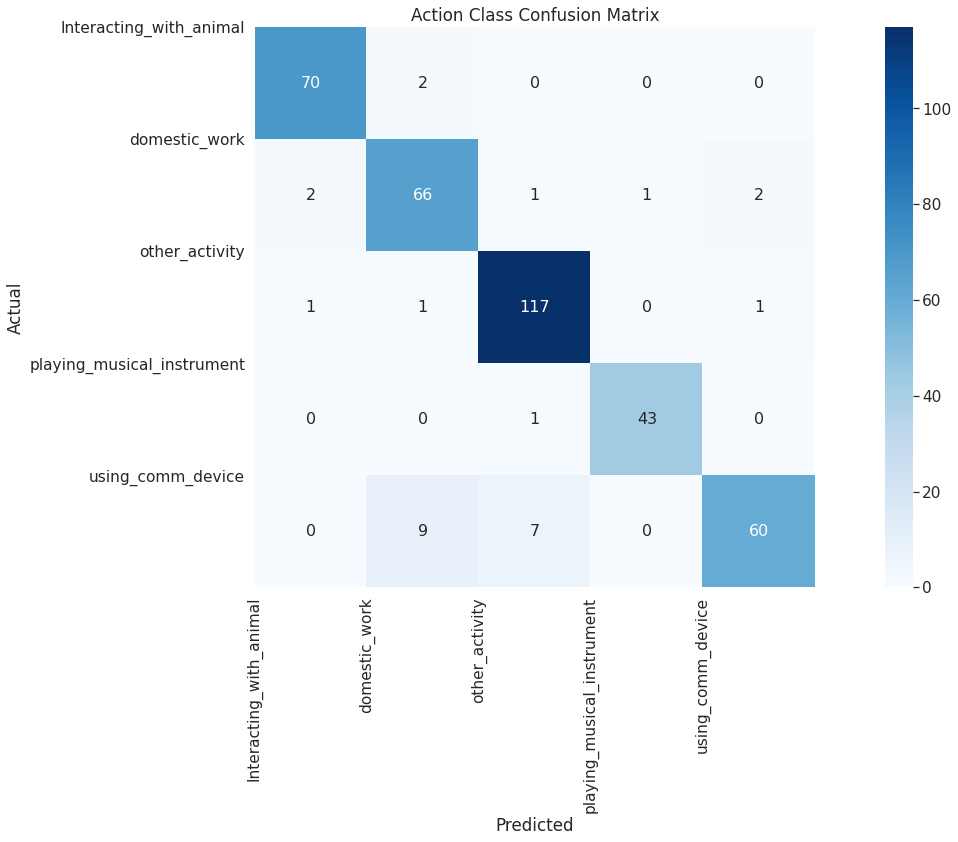

In [ ]:
# NasnetMobile Finetuned model
nasnet_model = tf.keras.models.load_model(DATA_DIR + 'nasnet_finetuned_1_model')
model_result(nasnet_model, validation_generator)

Observation: Comparing the results from three models, it is evident that InceptionV3 outperforms other models.

VGG model wasn't able to classify even some distiguisable action and performed poor overall. However, inceptionv3 and nasnet both were able to correctly classify most of the actions. For actions which are closely related such as watching tv and using a computer, there was some misclassification as TV and computer look alike which is quite obvious in still images. Similarly for actions such as taking photos, texting and phoning, both involved using same devices hence, the model wasn't able to identify the right action. In Overall, inceptionv3 was able to correctly most of the actual actions and action classes.  


## Test Set Performance

In [ ]:
# No shuffle because we don't compute GD here!
test_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':False,
    'data_prefix': IMAGE_DIR}
test_generator = ImageDataLoader(test,**test_params)

Action Macro F1-score:  0.61560064800637
Action Class Macro F1-Score :  0.8113085476614887
------------------------------------------------------------------------------------------------------------
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.67      0.62      0.65        16
          climbing       0.93      0.93      0.93        29
           cooking       0.79      0.68      0.73        28
cutting_vegetables       0.57      0.36      0.44        11
   feeding_a_horse       0.69      0.74      0.71        27
         gardening       0.85      0.73      0.79        15
           jumping       0.85      0.59      0.69        29
           phoning       0.35      0.25      0.29        24
    playing_guitar       1.00      0.46      0.63        28
    playing_violin       0.49      0.78      0.60        23
     riding_a_bike       0.96      0.86      0.91        29
    riding_a_horse       0.73      0.93      0.8

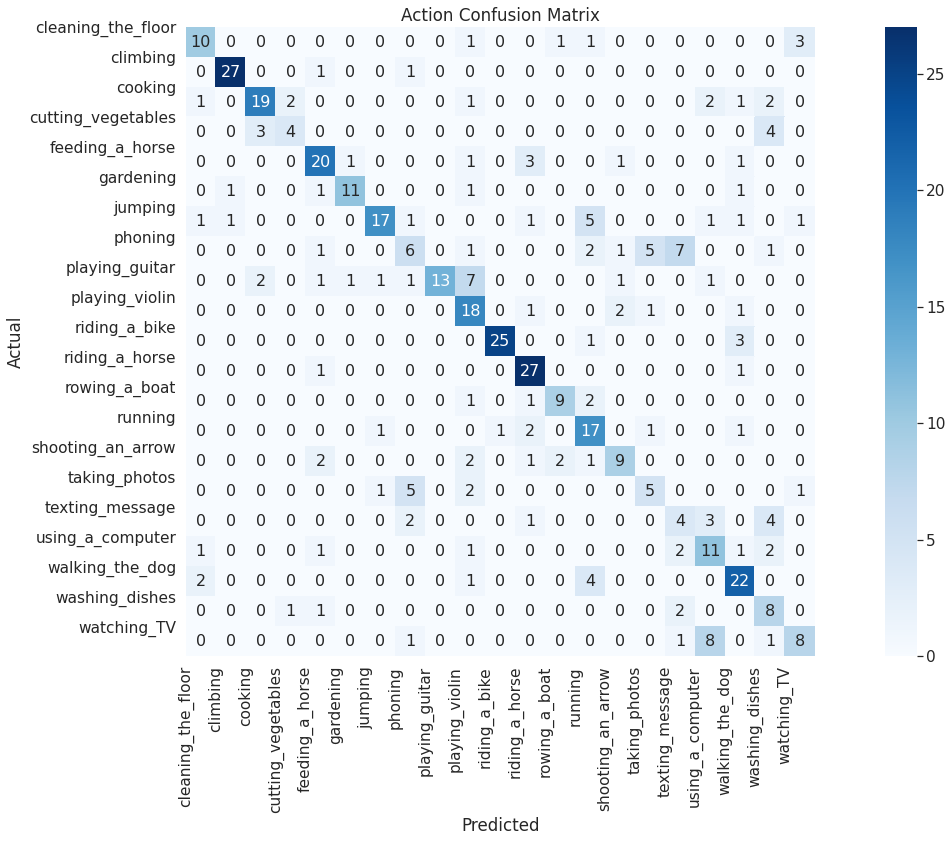

---------------------------------------------------------------------------------------------------------------


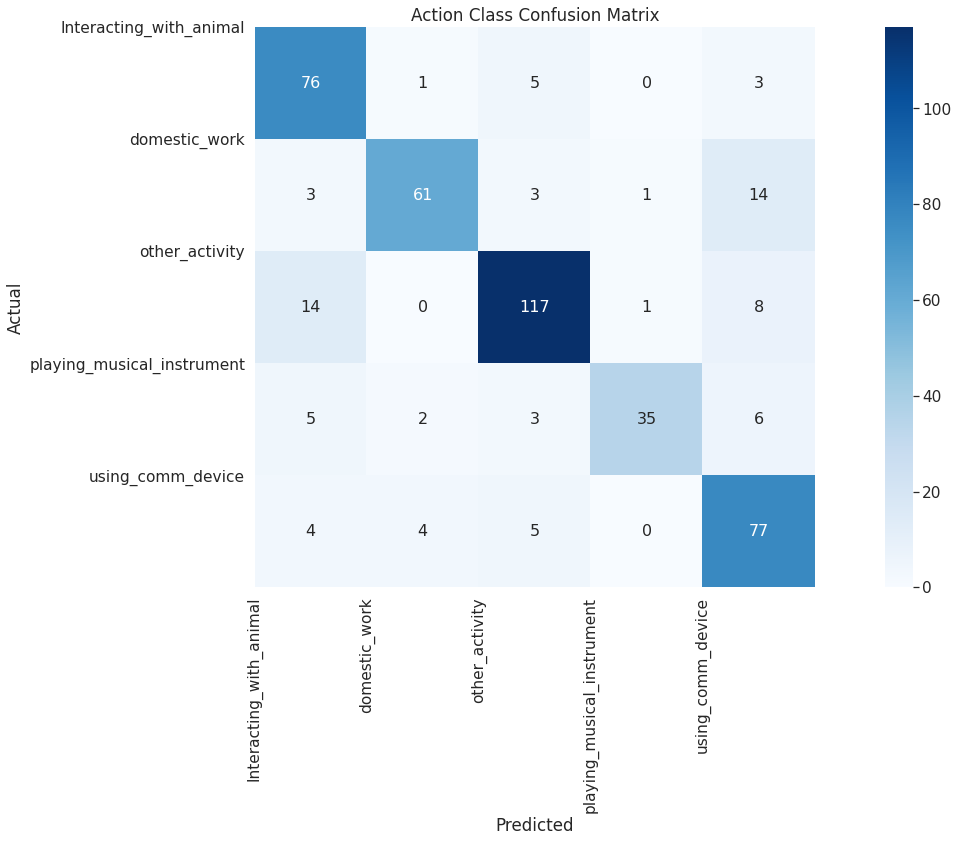

In [ ]:
model_result(vgg_16, test_generator)

Action Macro F1-score:  0.7747918610107372
Action Class Macro F1-Score :  0.9385363915980159
------------------------------------------------------------------------------------------------------------
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.74      0.88      0.80        16
          climbing       0.75      0.93      0.83        29
           cooking       0.73      0.57      0.64        28
cutting_vegetables       0.46      0.55      0.50        11
   feeding_a_horse       0.83      0.93      0.88        27
         gardening       1.00      0.80      0.89        15
           jumping       0.61      0.66      0.63        29
           phoning       0.79      0.79      0.79        24
    playing_guitar       0.96      0.82      0.88        28
    playing_violin       1.00      0.78      0.88        23
     riding_a_bike       0.97      0.97      0.97        29
    riding_a_horse       0.97      0.97      0

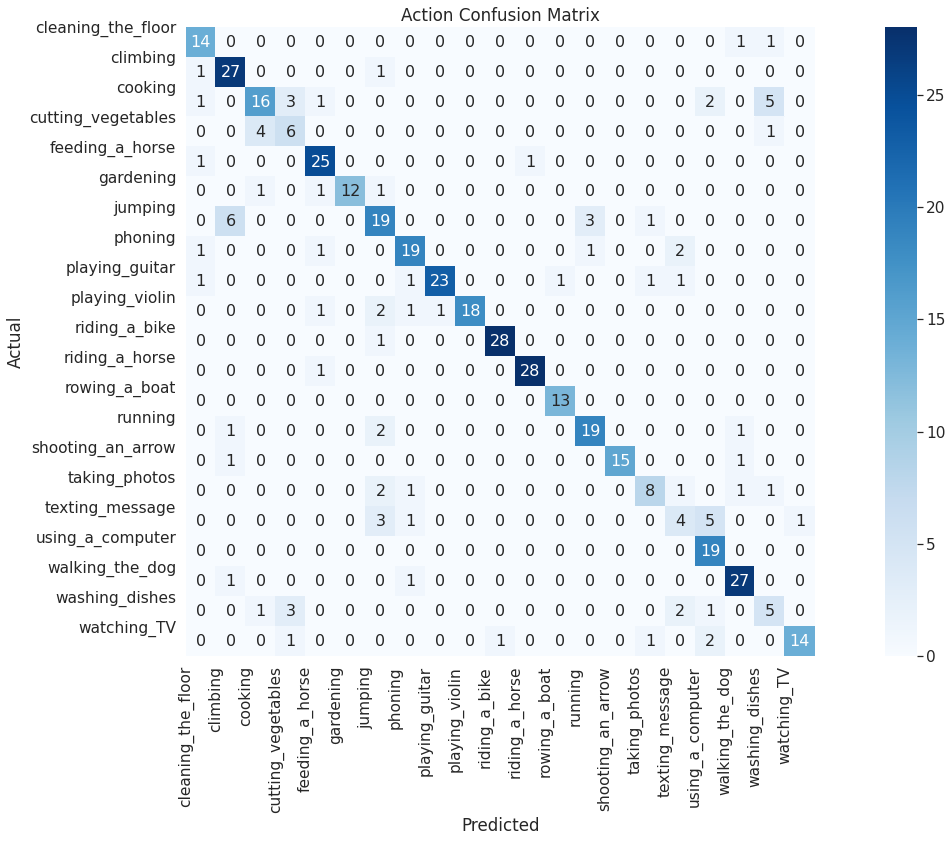

---------------------------------------------------------------------------------------------------------------


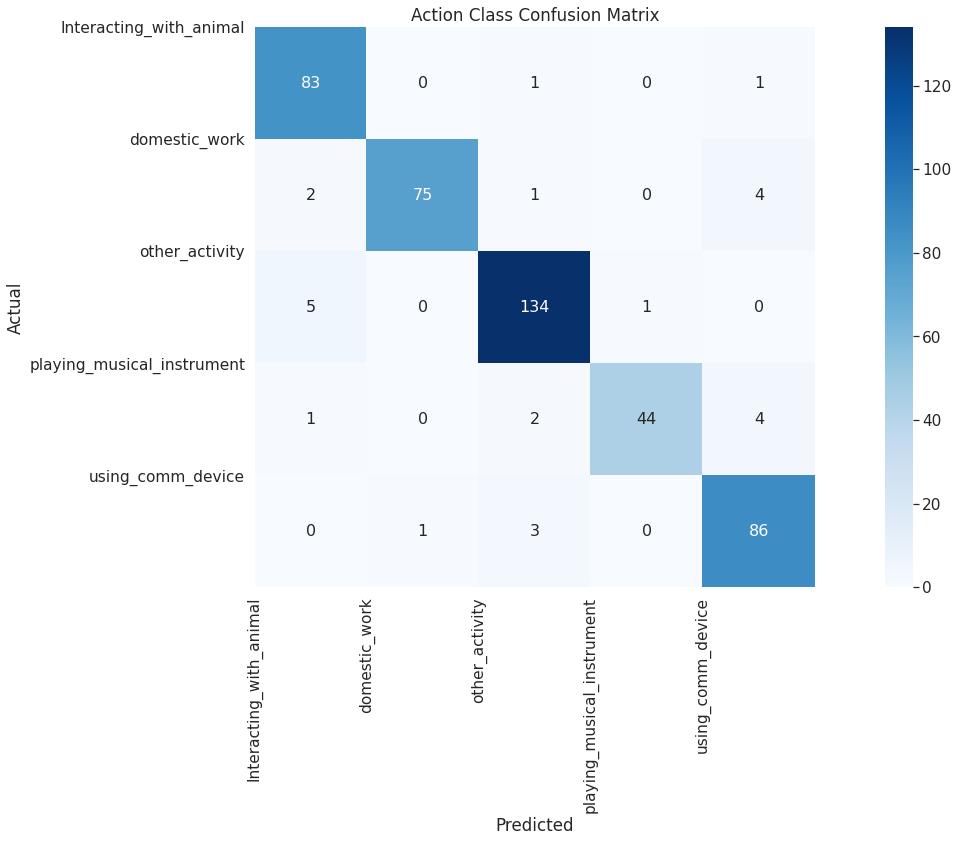

In [ ]:
model_result(inceptionv3, test_generator)

Action Macro F1-score:  0.7630823026374529
Action Class Macro F1-Score :  0.9204578960388622
------------------------------------------------------------------------------------------------------------
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       1.00      1.00      1.00        16
          climbing       0.84      0.93      0.89        29
           cooking       0.75      0.54      0.63        28
cutting_vegetables       0.43      0.55      0.48        11
   feeding_a_horse       0.96      0.96      0.96        27
         gardening       0.80      0.80      0.80        15
           jumping       0.80      0.69      0.74        29
           phoning       0.55      0.67      0.60        24
    playing_guitar       0.96      0.79      0.86        28
    playing_violin       0.80      0.87      0.83        23
     riding_a_bike       1.00      1.00      1.00        29
    riding_a_horse       1.00      0.93      0

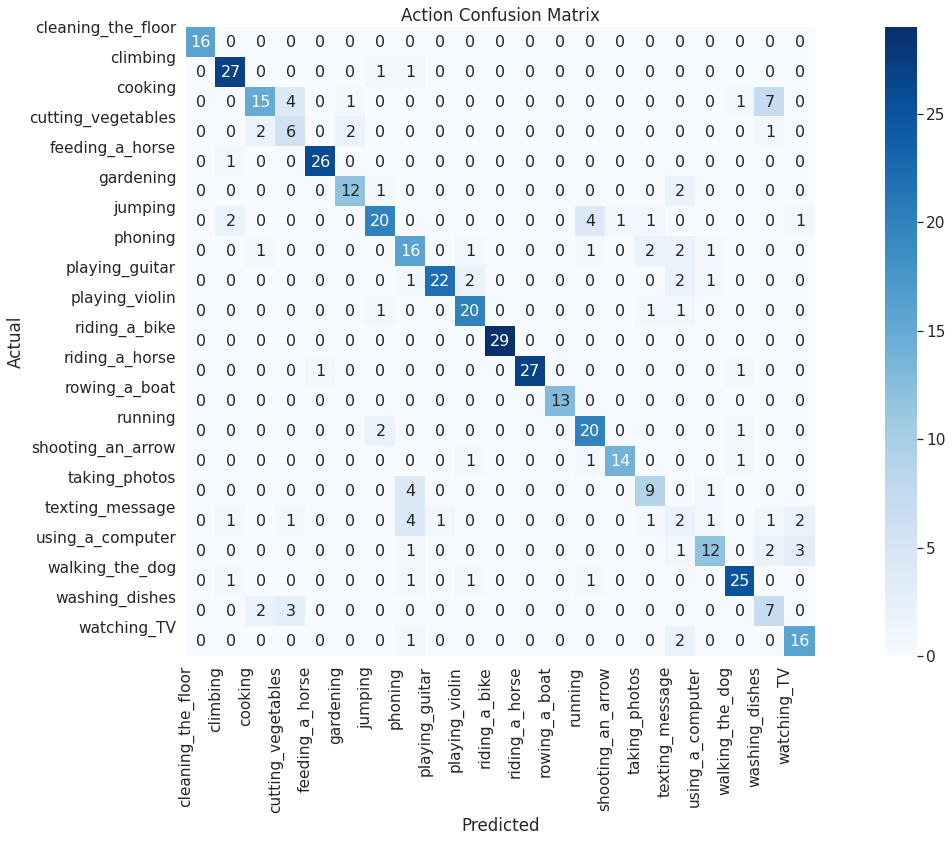

---------------------------------------------------------------------------------------------------------------


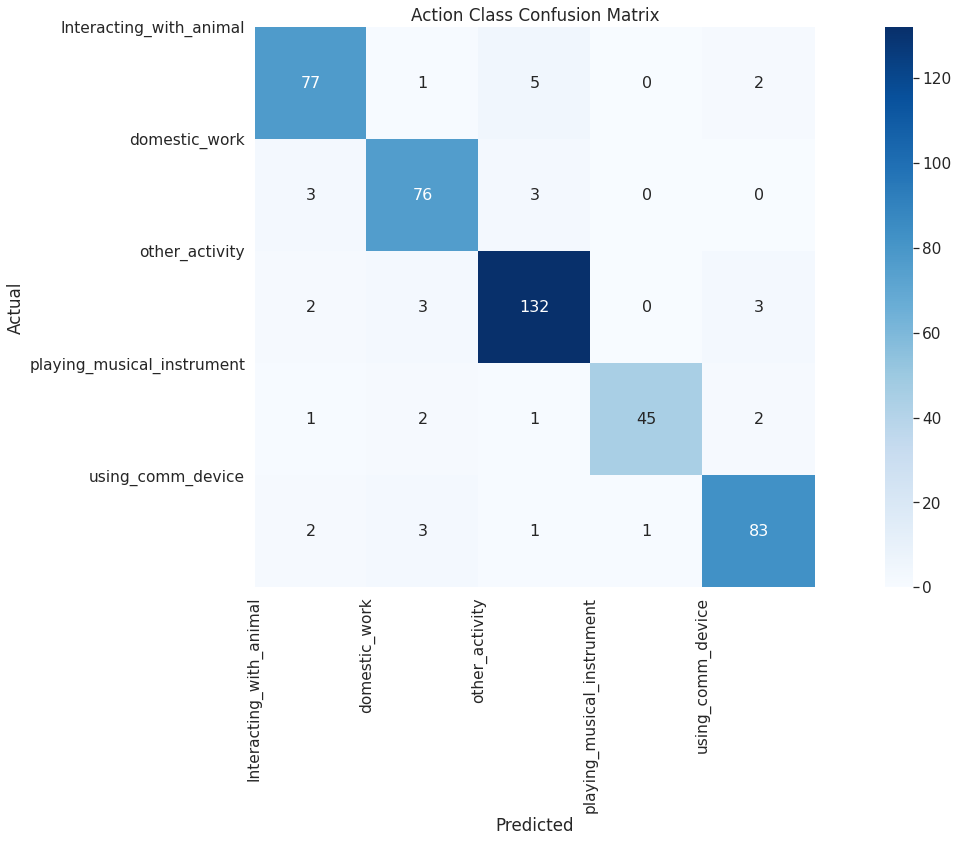

In [ ]:
model_result(nasnet_model, test_generator)

In [ ]:
# No shuffle because we don't compute GD here!
test_param = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':1,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':False,
    'data_prefix': IMAGE_DIR}
test_generator_sample = ImageDataLoader(test,**test_param)

In [ ]:
# Dictionary of labels and encoded values
actions = dict(zip(train_data['action_label'].unique(), action_encoder.inverse_transform(train_data['action_label'].unique())))
action_classes = dict(zip(train_data['action_class_label'].unique(), action_cls_encoder.inverse_transform(train_data['action_class_label'].unique())))

In [ ]:
def get_predictions(model, generator, df):
  action_preds, action_cls_preds = model.predict(test_generator_sample)
  action_pred = np.argmax(action_preds, axis = -1)
  action_cls_pred = np.argmax(action_cls_preds, axis = -1)
  df['Pred_action'] = action_encoder.inverse_transform(action_pred)
  df['Pred_action_class'] = action_cls_encoder.inverse_transform(action_cls_pred)
  df = df.reset_index(drop= True)
  return df

In [ ]:
inception_df = get_predictions(inceptionv3, test_generator_sample, test)
nasnet_df = get_predictions(nasnet_model, test_generator_sample, test)

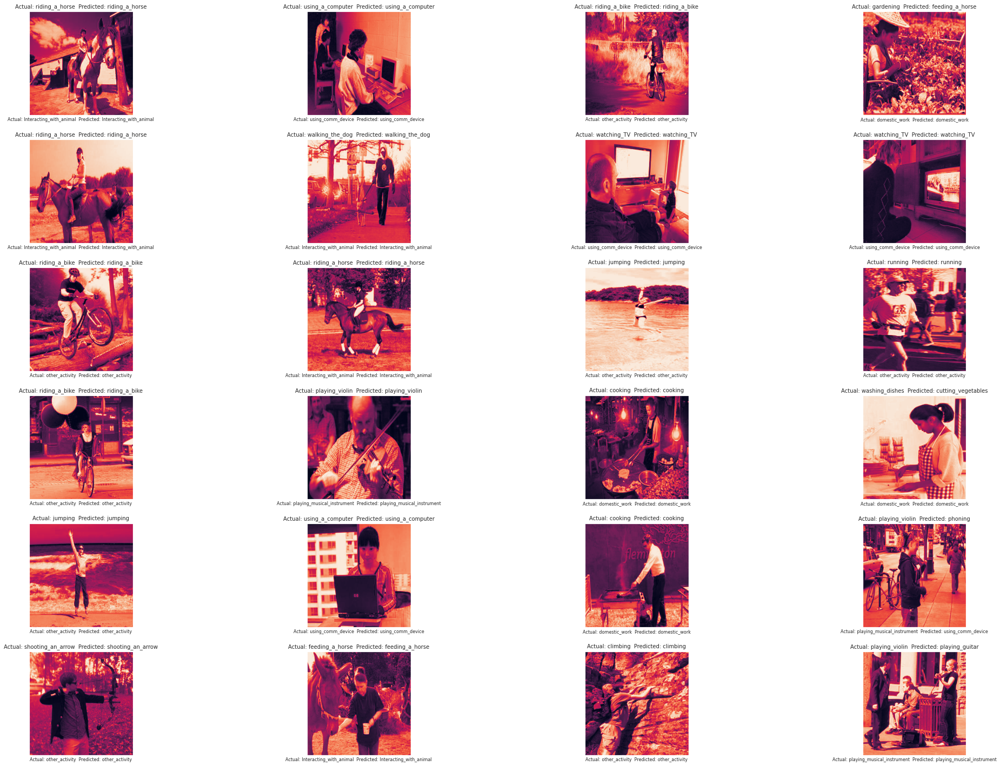

In [ ]:
# plt.figure(figsize = (30,20))
# i = 0
# for x,y in test_generator_sample.__iter__():
#   plt.subplot(6,4,i+1)
#   plt.grid(False)
#   plt.imshow(x[0,:,:,0])
#   plt.title('Actual: '+ str(actions[y[0][0]]) +'  ' + 'Predicted: ' + str(actions[action_pred[i]]),fontsize = 10)
#   plt.xlabel('Actual: '+ str(action_classes[y[1][0]]) +'  ' + 'Predicted: ' + str(action_classes[action_cls_pred[i]]), fontsize = 8)
#   plt.xticks([])
#   plt.yticks([])
#   i = i + 1
#   if i == 24:
#     break
# plt.tight_layout(rect =  [0,0,1,1])

Out of few samples from the test set, we can observe that most of the images were correctly classified. However, when we look at misclassified ones, some are complex to recognise such as washing dishes vs cutting vegetables and playing violin vs playing guitar. Another misclassification which is to be noted is when the action is playing guitar but was misclassified as rowing a bot. This might due to the postures of a person that is similar when performing these kinds of actions. One way to solve this is to increase the number of examples so that model can capture other kinds of discriminative features.


In [ ]:
inception_mis_classified = inception_df[(inception_df['action'] != inception_df['Pred_action']) | (inception_df['action_class']!= inception_df['Pred_action_class'])].reset_index(drop=True)
nasnet_mis_classified = nasnet_df[(nasnet_df['action'] != nasnet_df['Pred_action']) | (nasnet_df['action_class']!= nasnet_df['Pred_action_class'])].reset_index(drop=True)

In [ ]:
# Explore Misclassified Images 
def plot_misclassification(df):
  plt.figure(figsize = (20,20))
  for i in range(18):
    plt.subplot(6, 3, i+1)
    plt.imshow(Image.open(os.path.join(IMAGE_DIR,df.iloc[i]['FileName'])))
    plt.title('True action: '+ str(df.iloc[i]['action']) + ' Predicted action: '+ str(df.iloc[i]['Pred_action']),fontsize = 10)
    plt.xlabel('True action_class: '+ str(df.iloc[i]['action_class']) + ' Pred action_class: '+ str(df.iloc[i]['Pred_action_class']),fontsize = 10)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout(rect = [0, 0.03, 1, 0.95])
  return plt.show()

In [ ]:
# Helper functions to plot targets an its frequencies 
def plot_values(df,cols):
  plt.figure(figsize = (12,6))
  for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    (df[col].value_counts(normalize = True)*100).sort_values().plot.barh(width = 0.8)
    plt.title("Misclassification of " + str(col).capitalize())
    plt.ylabel(" ")
    plt.xlabel("Percentage")
  plt.tight_layout()
  plt.show()

#### InceptionV3 Misclassifications

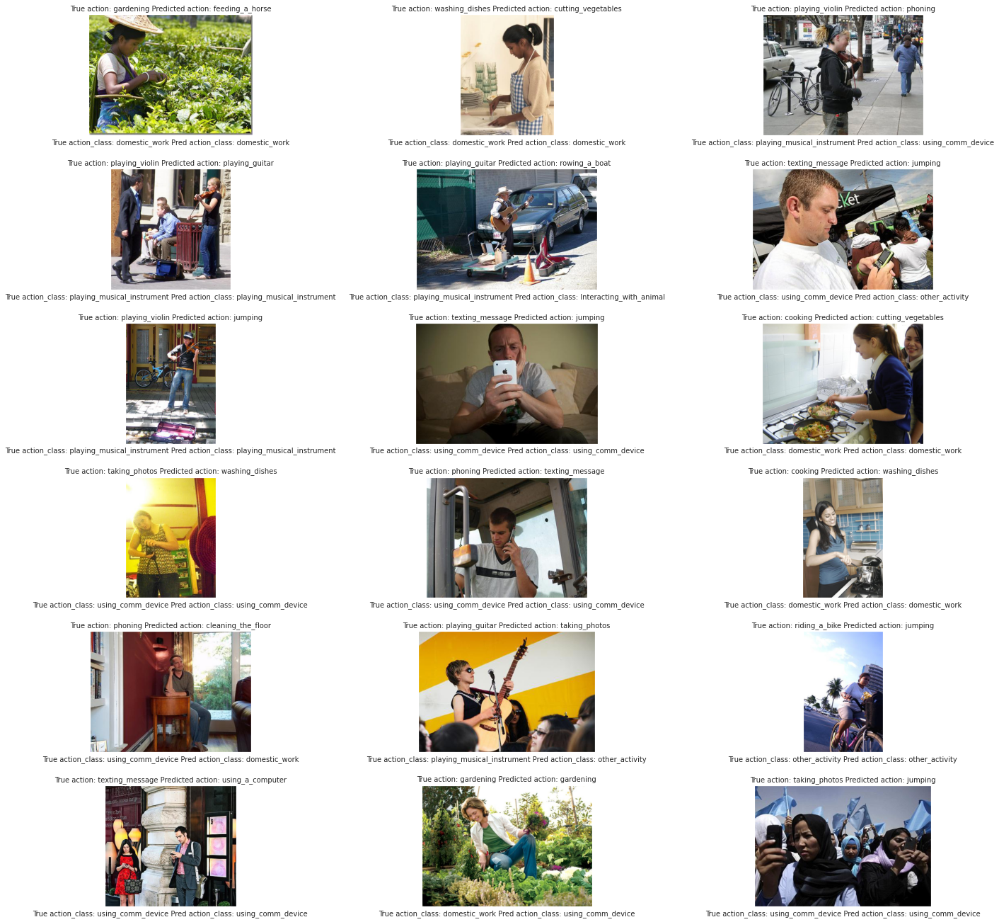

In [ ]:
plot_misclassification(inception_mis_classified)

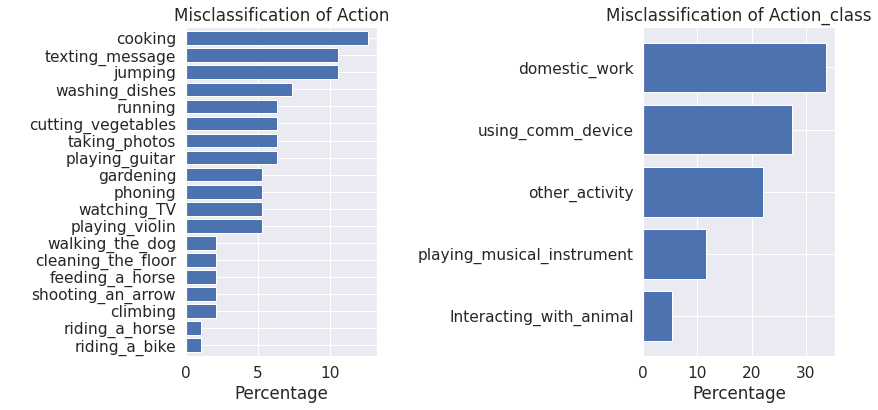

In [ ]:
targets = ['action','action_class']
plot_values(inception_mis_classified, targets)

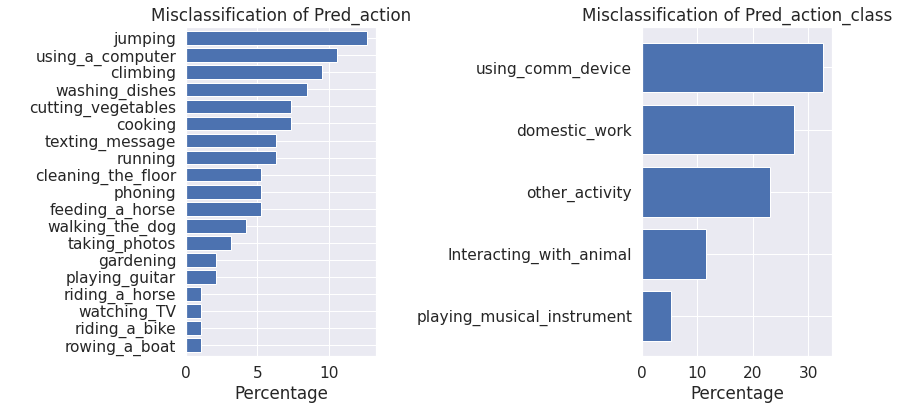

In [ ]:
pred_targets = ['Pred_action','Pred_action_class']
plot_values(inception_mis_classified, pred_targets)

#### Nasnet Mobile Misclassifications

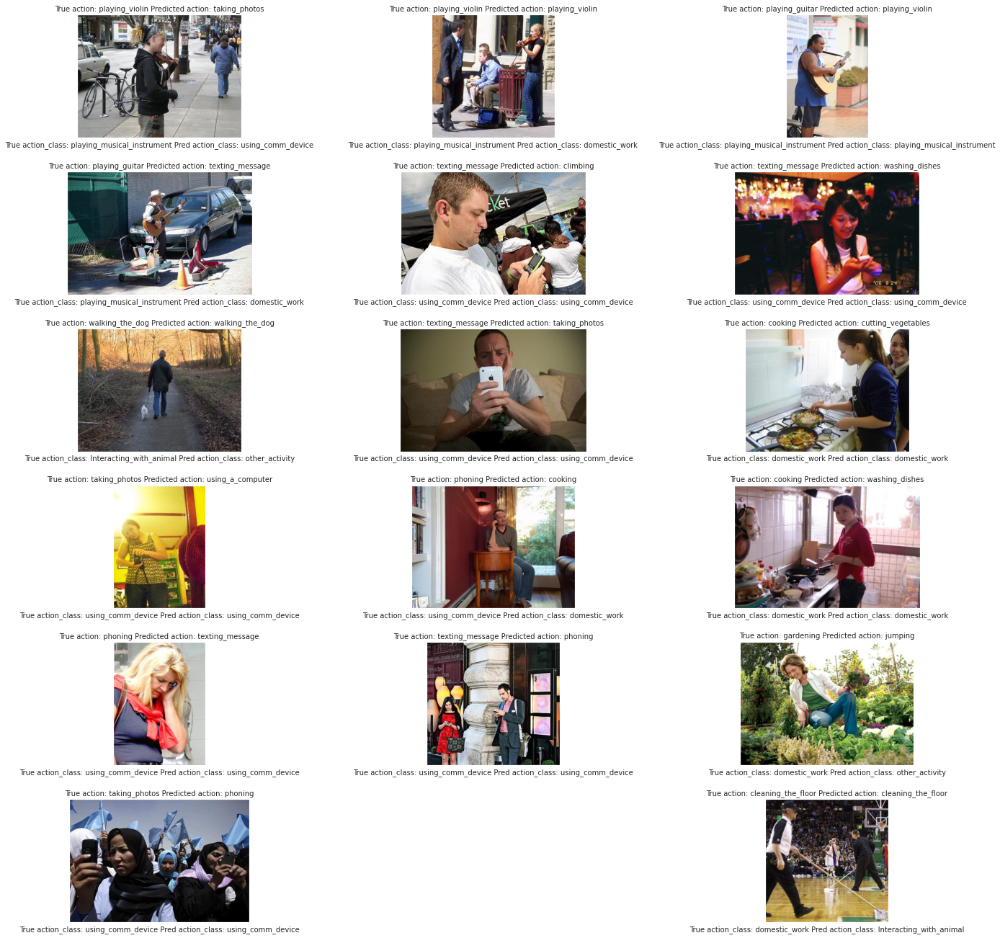

In [ ]:
plot_misclassification(nasnet_mis_classified)

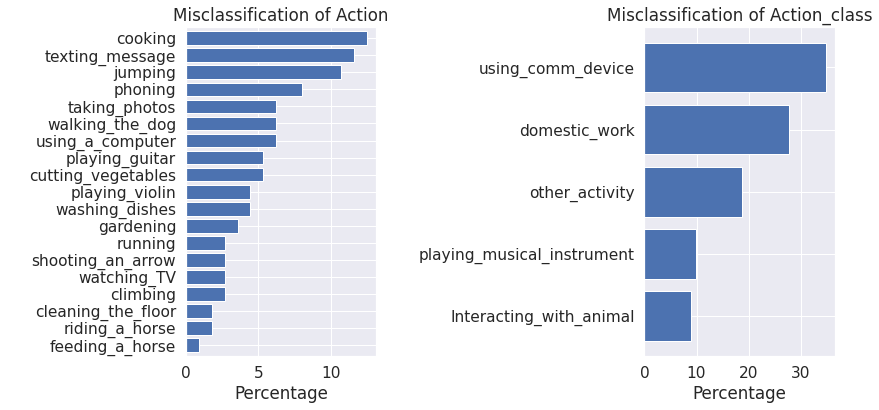

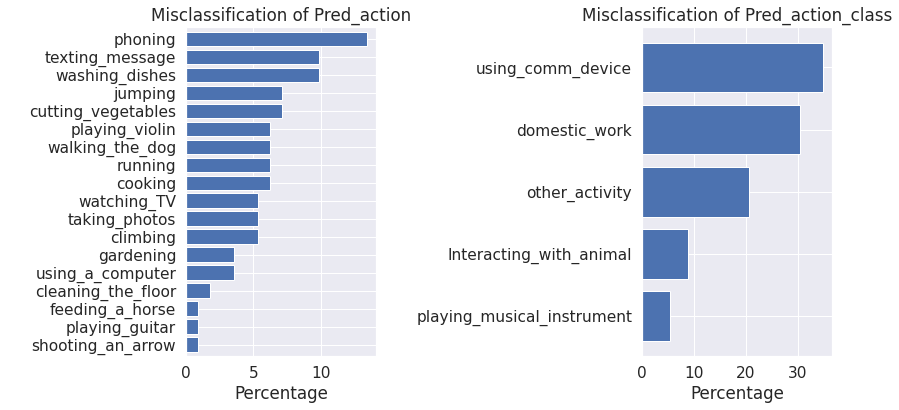

In [ ]:
plot_values(nasnet_mis_classified, targets)
plot_values(nasnet_mis_classified, pred_targets)

Looking at the above exploration, most of the misclassifications are the same between inception and nasnet models. It might be due to fewer images in those classes. We can see that these models were not able to predict similar actions. For example, images that had action using mobile phones (texting_message, phoning) were misclassified. Also, images where two postures are similar ( cutting vegetables & cooking), the model couldn't identify them correctly. Other errors are also to be noted: when the actions are entirely different (texting vs jumping), (texting vs climbing) , (texting vs jumping). A similar error can be seen in action classes as well. It is due to the distribution of action and action classes where the model predicts actions the majority labels. This is one of the main limitations, regardless of the models we select, as both are common. When we look at the proportion of misclassifications, cooking, texting_message, and jumping were the most common error in inception and nasnet. However, the predicted labels' proportion was slightly different(one class classified more than the others).  Let us look at some out-of-sample images for the top-3 misclassification labels and see how it performs.

In [ ]:
def convert_image(filename):
  img = Image.open(DATA_DIR + filename)
  img = img.resize((224,224))
  #img = np.expand_dims(img, axis = 0)
  data = np.asarray(img)
  X = data
  X = (X - 0.)/255.
  return X.reshape(1,224,224,3)

def model_predict(model, img):
  action_preds, action_cls_preds = model.predict(img)
  action_pred = np.argmax(action_preds, axis = -1)
  action_cls_pred = np.argmax(action_cls_preds, axis = -1)
  return action_pred, action_cls_pred

In [ ]:
def plot_image(model, filename):
  img = convert_image(filename)
  y, z = model_predict(model, img)
  plt.figure(figsize=(8,8))
  plt.imshow(img[0,:,:,0])
  plt.xticks([])
  plt.yticks([])
  plt.xlabel('Action:' + str(actions[y[0]]) + ' ' + 'Action Class: ' + str(action_classes[z[0]]), fontsize = 12)
  return plt.show()

Inception


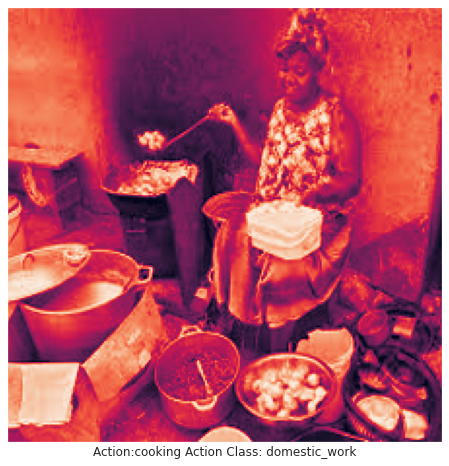

Nasnet


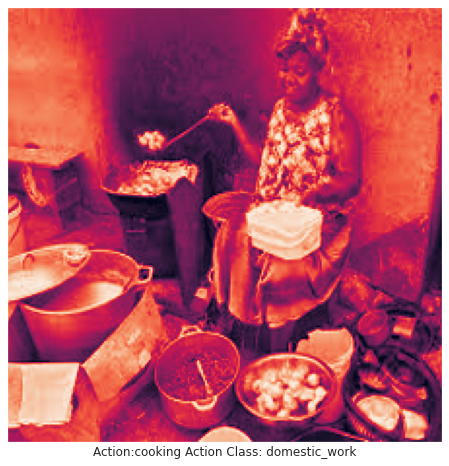

Inception


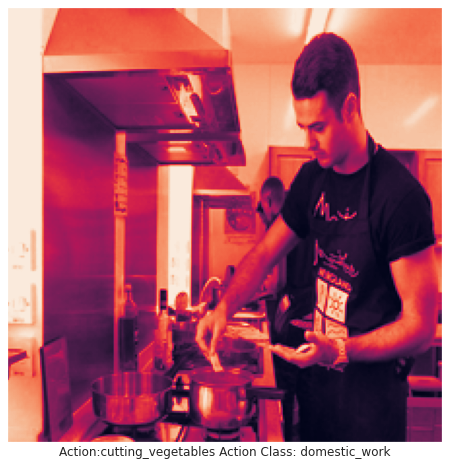

Nasnet


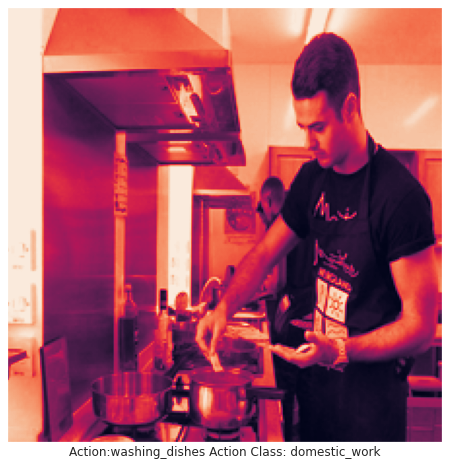

Inception


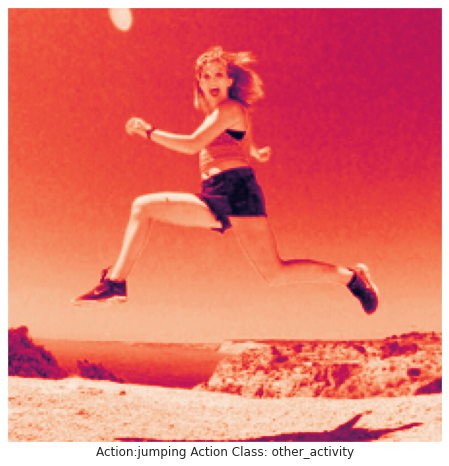

Nasnet


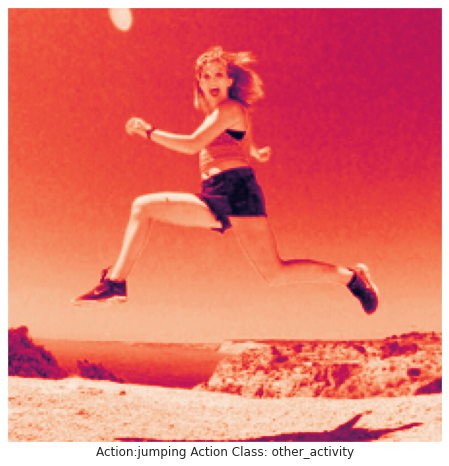

Inception


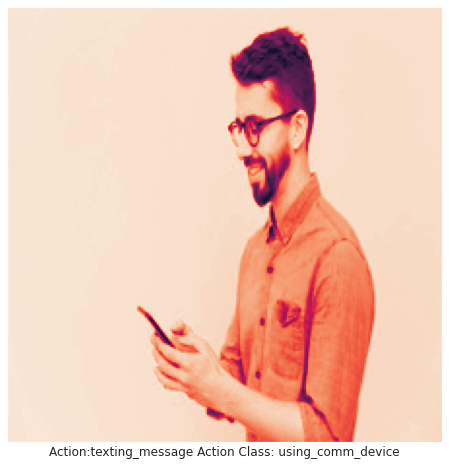

Nasnet


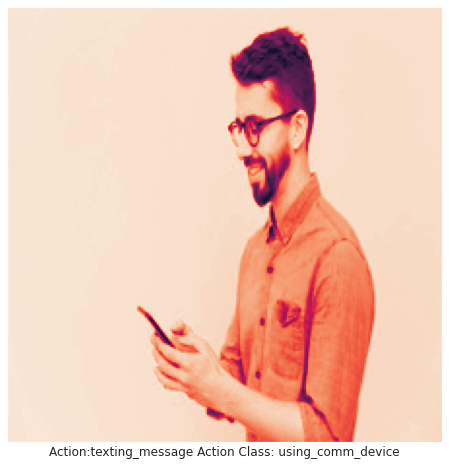

Inception


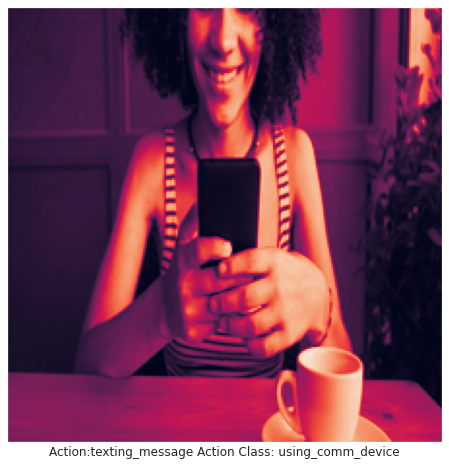

Nasnet


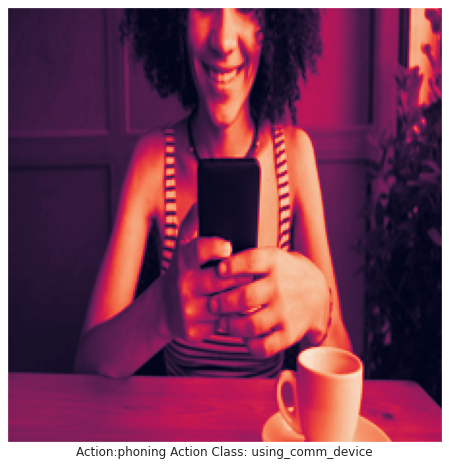

Inception


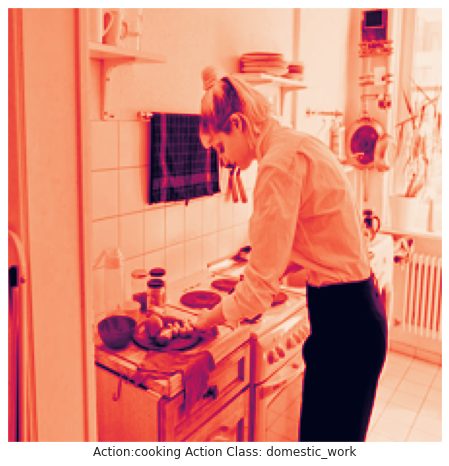

Nasnet


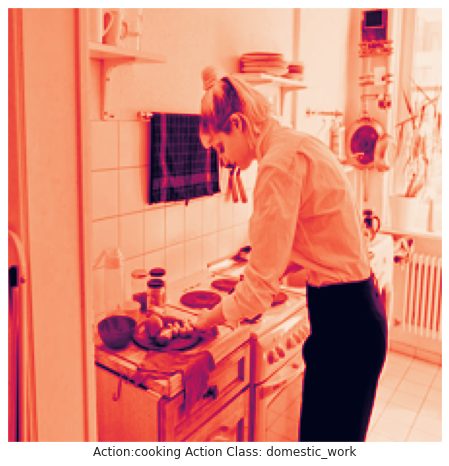

Inception


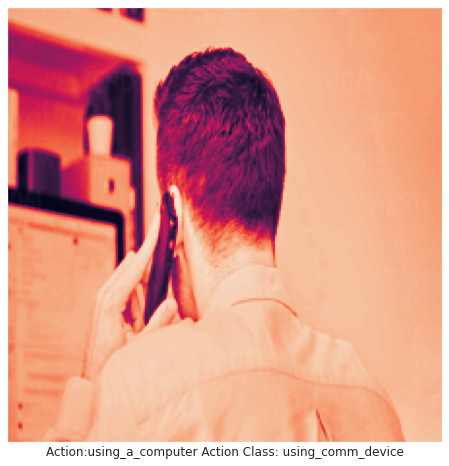

Nasnet


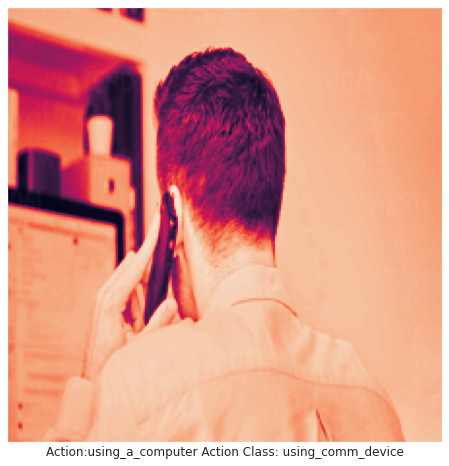

Inception


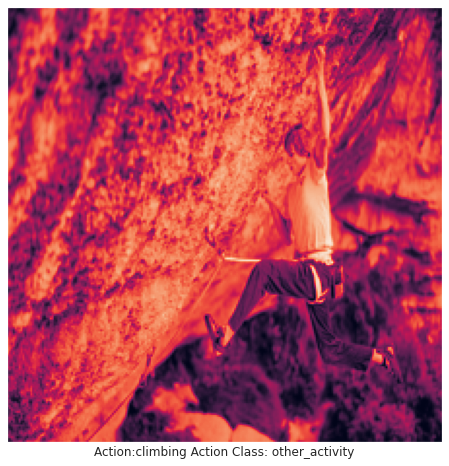

Nasnet


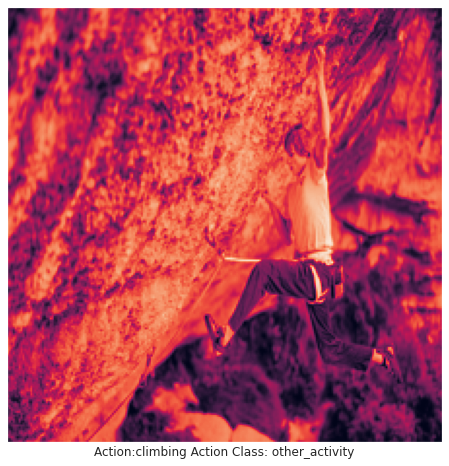

Inception


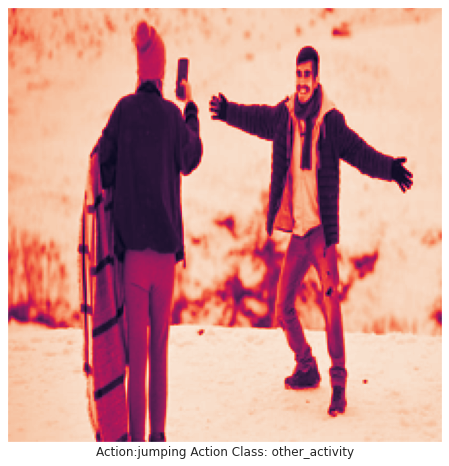

Nasnet


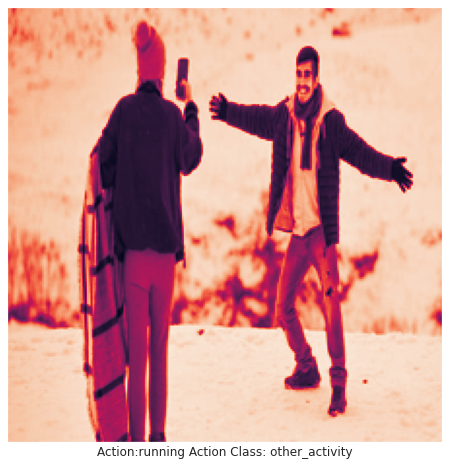

Inception


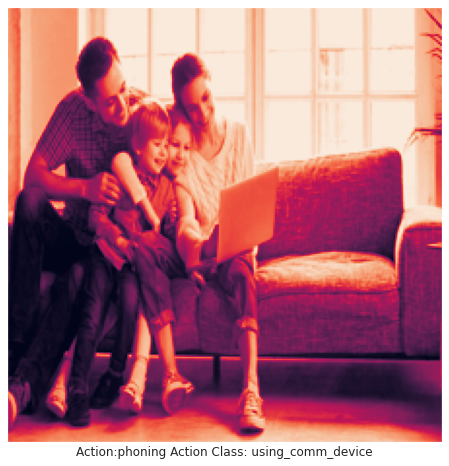

Nasnet


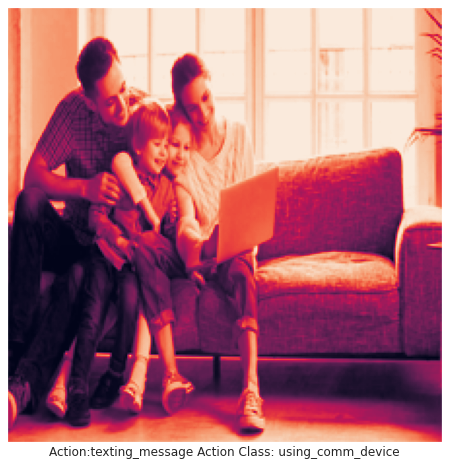

In [203]:
images = ['cooking_img.jfif','cooking.jfif','jumping.jpg','texting.jpg','texting_1.jpg','cutting.jpg','phone_call.jpg','climbing.jpg','taking_photo.jpg','using_computer.jpg']
for image in images:
  print('Inception')
  plot_image(inceptionv3,image)
  print('Nasnet')
  plot_image(nasnet_model,image)

Looking at out of sample images, there is no clear winner between inceptionv3 and nasnetmobile. Both the models have correct and incorrect predictions from the same images. However, for one image inception was able to correctly classify (texting over phoning). Therefore, we decide to use inceptionv3 as our final model based on the evidence from confusion matrix, number of misclassifications and out-of sample testing although both results are close enough. For even better predictions, we would add images from minority classes and re-train the model. As more of human action and action classes can be predicted with this approach, it can be used in the real-world setting. 

## Submission on Test Data

In [204]:
# Data Generator
class TestDataLoader(tf.keras.utils.Sequence):
    def __init__(self,
                 df,
                 batch_size=32,
                 dim=(224,224, 3),
                 img_size = (224,224),
                 data_mean=0,
                 data_std=1,
                 data_prefix=''):
        
        'Initialization'
        self.dim = dim  # Dimensions of the input
        self.batch_size = batch_size # Batch size
        self.img_size = img_size # Image size

        # The data is input as a pandas dataframe, we need to read the relevent fields
        self.df = df
        self.image_ids = np.arange(len(self.df.index)).tolist()
        self.data_prefix = data_prefix
        self.indexes = np.arange(len(self.image_ids))
        # Data normalization parameters
        self.data_mean = data_mean
        self.data_std = data_std
        
        #self.on_epoch_end()
        
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data for the given index'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        # Find list of IDs
        data_ids_temp = [self.image_ids[k] for k in indexes]
        
        # Generate data
        X = self.__data_generation(data_ids_temp)
        
        return X

            
    def __data_generation(self, data_ids_temp):
        'Generates data containing batch_size samples' 

        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        
        # Generate data
        for i, ids in enumerate(data_ids_temp):
            X[i,] = self.__read_data_instance(data_ids_temp[i])
            
        return X


    def __read_data_instance(self, pid):
      # Read an image
      filepath = self.data_prefix + self.df.iloc[pid]['FileName']
      
      data = Image.open(filepath).convert('RGB')
      data = data.resize(self.img_size) # Resize image
      data = np.asarray(data) # Convert into numpy array
      X = data
      # Input normalization
      X = (X - self.data_mean)/self.data_std
      return X

In [205]:
# No shuffle because we don't compute GD here!
param = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':1,
    'data_mean':0.,
    'data_std':255.0,
    'data_prefix': IMAGE_DIR}

test_data_gen = TestDataLoader(test_data,**param)

In [208]:
action, action_class = inceptionv3.predict(test_data_gen)
action, action_class = np.argmax(action, axis = -1), np.argmax(action_class, axis = -1) 

In [211]:
pred_action = action_encoder.inverse_transform(action)
pred_action_class = action_cls_encoder.inverse_transform(action_class)
test_data['action'] = pred_action
test_data['action_class'] = pred_action_class

In [214]:
test_data.to_csv(DATA_DIR + 's3819491_predictions.csv',index = 0)